# Understanding Convolutional Neural Networks - DeepDream
by Gaetano Bonofiglio, Veronica Iovinella

## Introduction
In the previous notebooks we've used and built many convolutional neural networks for image recognition, but we never really understood what was happening between the convolutional layers, expecially with huge networks like Inception Model. 

In this notebook we want to experiment a bit with something that Google calls **DeepDream**.

DeepDream is a computer vision program created by Google which uses a convolutional neural network to find and enhance patterns in images via algorithmic **pareidolia**, thus creating a dreamlike hallucinogenic appearance in the deliberately over-processed images. Pareidolia is a psychological phenomenon involving a stimulus (an image or a sound) wherein the mind perceives a familiar pattern of something where none actually exists. 

The DeepDream software originates in Inception and was developed for the ImageNet Large-Scale Visual Recognition Challenge (ILSVRC) in 2014 and released in July 2015. Once trained, the network can also be run in reverse, being asked to adjust the original image slightly so that a given output neuron (e.g. the one for faces or certain animals) yields a higher confidence score. This can be used for visualizations to understand the emergent structure of the neural network better, and is the basis for the DeepDream concept. 

The following function used to *produce dreams* are taken from [Google Research blog post](http://googleresearch.blogspot.ch/2015/06/inceptionism-going-deeper-into-neural.html) and used to produce old and new examples.


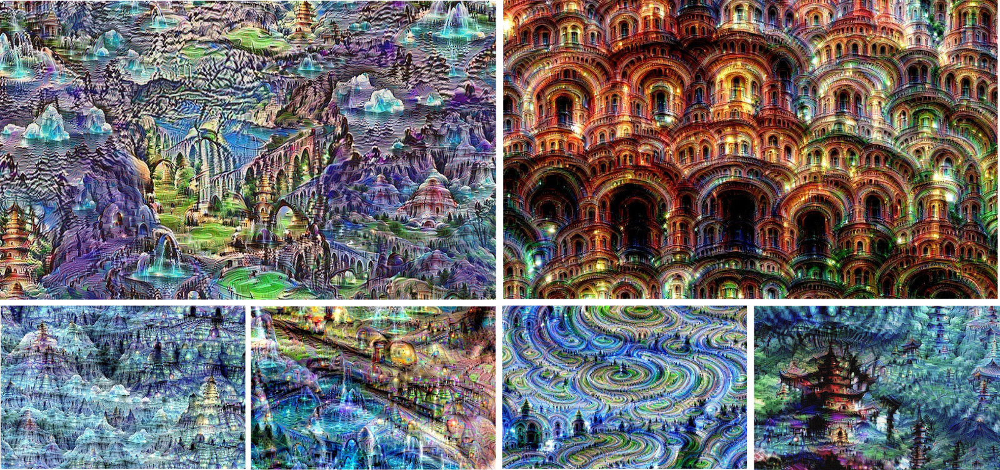

In [1]:
from IPython.display import Image
Image('images/07_buildingDreams.png')

To show a quick example, in the following image on the left is the original sky from Google Research blog post, in the middle is actually the same sky after 1 iteration of the algorithm, while on the right is still the same sky after 30 iterations of the algorithm. 

The image was produced in a different notebook and took about one hour without a GPU. 

Among the iterations, the network started by associating some noise with animals and buildings and some edges around the clouds with trees. Later on, the large blue portion in the center started to be associated with a road, with trees and buildings on the side and cars, pedestrians and animals on top.

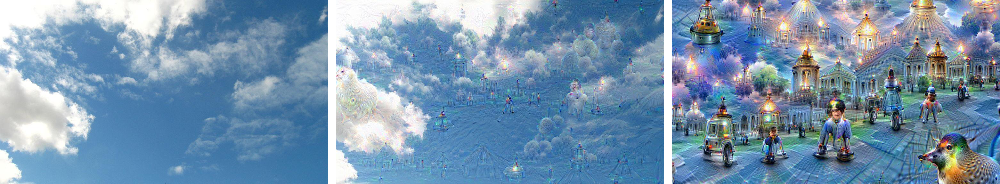

In [2]:
Image('images/07_skies.png')

We also tested the same image on a different machine, using the same network, and we could notice that there were similarities (the road and the structure in general), but also a lot of differences (mainly different animals and creatures), suggesting that the results may differ with each run even starting with the same picture. This suggests that the network is more *confident* about some shapes in general, and less about others. Round cars with pedestrian heads on top seem to appear very often on roads.

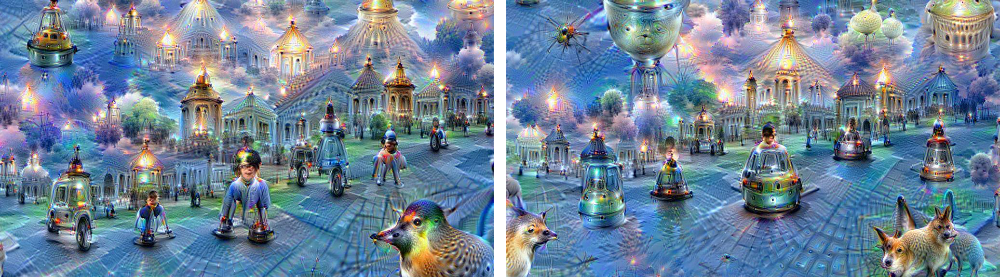

In [3]:
Image('images/07_skyComparison.png')

## Imports and basic notebook setup

In [4]:
from cStringIO import StringIO
import numpy as np
import os.path
import scipy.ndimage as nd
import PIL.Image
from IPython.display import clear_output, Image, display
from google.protobuf import text_format

import caffe

# If your GPU supports CUDA and Caffe was built with CUDA support,
# uncomment the following to run Caffe operations on the GPU.
# caffe.set_mode_gpu()
# caffe.set_device(0) # select GPU device if multiple devices exist

def showarray(a, fmt='jpeg'):
    a = np.uint8(np.clip(a, 0, 255))
    f = StringIO()
    PIL.Image.fromarray(a).save(f, fmt)
    display(Image(data=f.getvalue()))

### Loading DNN model
In this notebook we are going to use a [GoogLeNet](https://github.com/BVLC/caffe/tree/master/models/bvlc_googlenet) model trained on [ImageNet](http://www.image-net.org/) dataset.

In [5]:
model_path = '../../caffe/models/bvlc_googlenet/' # substitute your path here
net_fn   = model_path + 'deploy.prototxt'
param_fn = model_path + 'bvlc_googlenet.caffemodel'

# Patching model to be able to compute gradients.
# Note that you can also manually add "force_backward: true" line to "deploy.prototxt".
model = caffe.io.caffe_pb2.NetParameter()
text_format.Merge(open(net_fn).read(), model)
model.force_backward = True
open('tmp.prototxt', 'w').write(str(model))

net = caffe.Classifier('tmp.prototxt', param_fn,
                       mean = np.float32([104.0, 116.0, 122.0]), # ImageNet mean, training set dependent
                       channel_swap = (2,1,0)) # the reference model has channels in BGR order instead of RGB

# a couple of utility functions for converting to and from Caffe's input image layout
def preprocess(net, img):
    return np.float32(np.rollaxis(img, 2)[::-1]) - net.transformer.mean['data']
def deprocess(net, img):
    return np.dstack((img + net.transformer.mean['data'])[::-1])

## Producing dreams
Making the "dream" images is very simple. Essentially it is just a gradient ascent process that tries to maximize the L2 norm of activations of a particular DNN layer. Here are a few simple tricks that we found useful for getting good images:
* offset image by a random jitter
* normalize the magnitude of gradient ascent steps
* apply ascent across multiple scales (octaves)

First we implement a basic gradient ascent step function, applying the first two tricks:

In [6]:
def objective_L2(dst):
    dst.diff[:] = dst.data 

def make_step(net, step_size=1.5, end='inception_4c/output', 
              jitter=32, clip=True, objective=objective_L2):
    '''Basic gradient ascent step.'''

    src = net.blobs['data'] # input image is stored in Net's 'data' blob
    dst = net.blobs[end]

    ox, oy = np.random.randint(-jitter, jitter+1, 2)
    src.data[0] = np.roll(np.roll(src.data[0], ox, -1), oy, -2) # apply jitter shift
            
    net.forward(end=end)
    objective(dst)  # specify the optimization objective
    net.backward(start=end)
    g = src.diff[0]
    # apply normalized ascent step to the input image
    src.data[:] += step_size/np.abs(g).mean() * g

    src.data[0] = np.roll(np.roll(src.data[0], -ox, -1), -oy, -2) # unshift image
            
    if clip:
        bias = net.transformer.mean['data']
        src.data[:] = np.clip(src.data, -bias, 255-bias)    

Next we implement an ascent through different scales. We call these scales "octaves".

In [7]:
def deepdream(net, base_img, iter_n=10, octave_n=4, octave_scale=1.4, 
              end='inception_4c/output', clip=True, **step_params):
    # prepare base images for all octaves
    octaves = [preprocess(net, base_img)]
    for i in xrange(octave_n-1):
        octaves.append(nd.zoom(octaves[-1], (1, 1.0/octave_scale,1.0/octave_scale), order=1))
    
    src = net.blobs['data']
    detail = np.zeros_like(octaves[-1]) # allocate image for network-produced details
    for octave, octave_base in enumerate(octaves[::-1]):
        h, w = octave_base.shape[-2:]
        if octave > 0:
            # upscale details from the previous octave
            h1, w1 = detail.shape[-2:]
            detail = nd.zoom(detail, (1, 1.0*h/h1,1.0*w/w1), order=1)

        src.reshape(1,3,h,w) # resize the network's input image size
        src.data[0] = octave_base+detail
        for i in xrange(iter_n):
            make_step(net, end=end, clip=clip, **step_params)
            
            # visualization
            vis = deprocess(net, src.data[0])
            if not clip: # adjust image contrast if clipping is disabled
                vis = vis*(255.0/np.percentile(vis, 99.98))
            showarray(vis)
            print octave, i, end, vis.shape
            clear_output(wait=True)
            
        # extract details produced on the current octave
        detail = src.data[0]-octave_base
    # returning the resulting image
    return deprocess(net, src.data[0])

# custom cached version to save time
def deepdream_cached(net, img, path='notAValidPath', end='inception_4c/output'): 
    # check cache
    if os.path.exists(path):
        display(Image(path))
        print "Image loaded from " + path
    else: 
        frame=deepdream(net, img, end=end)
        if not (path=='notAValidPath'):
            PIL.Image.fromarray(np.uint8(frame)).save(path)

Finally this is a list of the layers of the network we are using. Layer names can be used to produce different details.

In [8]:
net.blobs.keys()

['data',
 'conv1/7x7_s2',
 'pool1/3x3_s2',
 'pool1/norm1',
 'conv2/3x3_reduce',
 'conv2/3x3',
 'conv2/norm2',
 'pool2/3x3_s2',
 'pool2/3x3_s2_pool2/3x3_s2_0_split_0',
 'pool2/3x3_s2_pool2/3x3_s2_0_split_1',
 'pool2/3x3_s2_pool2/3x3_s2_0_split_2',
 'pool2/3x3_s2_pool2/3x3_s2_0_split_3',
 'inception_3a/1x1',
 'inception_3a/3x3_reduce',
 'inception_3a/3x3',
 'inception_3a/5x5_reduce',
 'inception_3a/5x5',
 'inception_3a/pool',
 'inception_3a/pool_proj',
 'inception_3a/output',
 'inception_3a/output_inception_3a/output_0_split_0',
 'inception_3a/output_inception_3a/output_0_split_1',
 'inception_3a/output_inception_3a/output_0_split_2',
 'inception_3a/output_inception_3a/output_0_split_3',
 'inception_3b/1x1',
 'inception_3b/3x3_reduce',
 'inception_3b/3x3',
 'inception_3b/5x5_reduce',
 'inception_3b/5x5',
 'inception_3b/pool',
 'inception_3b/pool_proj',
 'inception_3b/output',
 'pool3/3x3_s2',
 'pool3/3x3_s2_pool3/3x3_s2_0_split_0',
 'pool3/3x3_s2_pool3/3x3_s2_0_split_1',
 'pool3/3x3_s2_p

Now we are ready to let the neural network reveal its dreams. 

### Sky pareidolia
It's not by chance that the first image used to produce dreams in many examples is the sky. Cloud shapes are probably the most common source of pareidolia in our everyday life. 

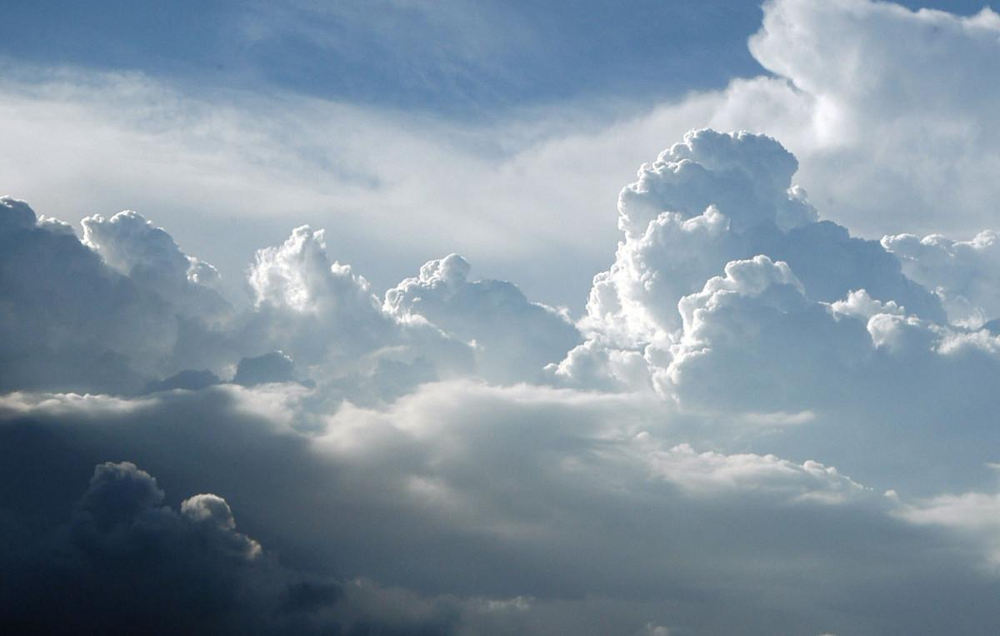

In [9]:
img = np.float32(PIL.Image.open('imagesForClassification/sky.jpg'))
showarray(img)

Running the next code cell starts the detail generation process. We may see how new patterns start to form, iteration by iteration, octave by octave.

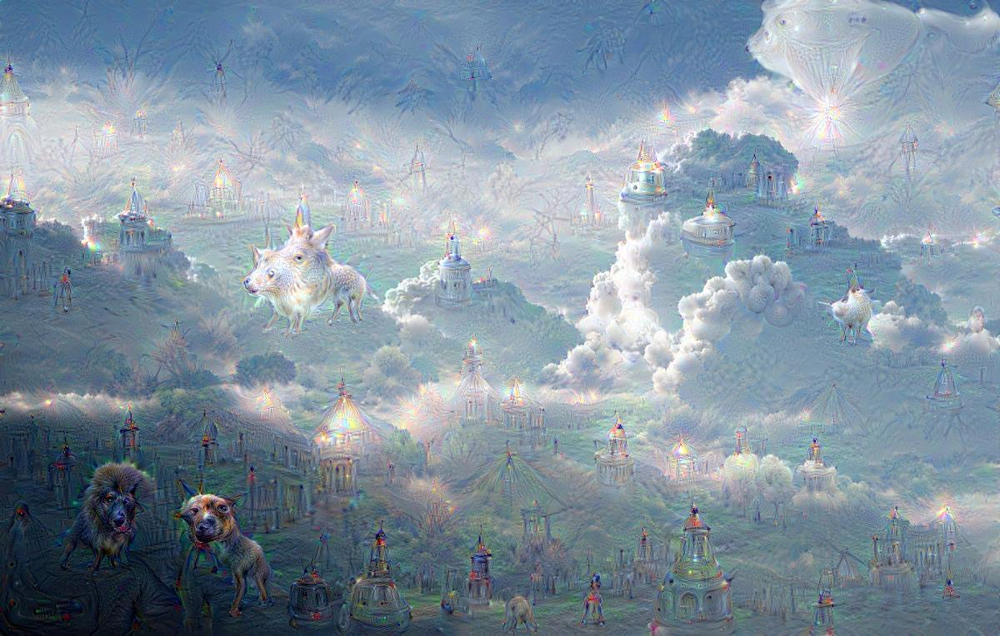

Image loaded from dreams/frame1.jpg


In [10]:
deepdream_cached(net, img, 'dreams/frame1.jpg')

The complexity of the details generated depends on which layer's activations we try to maximize. **Higher layers produce complex features, while lower ones enhance edges and textures**, giving the image an impressionist feeling.

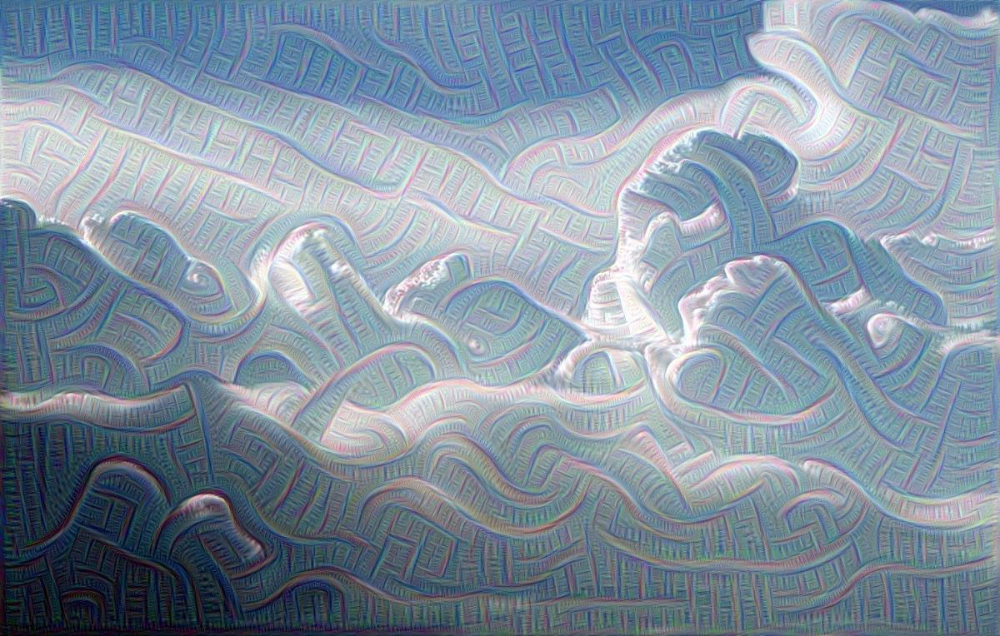

Image loaded from dreams/frame3b.jpg


In [11]:
deepdream_cached(net, img, 'dreams/frame3b.jpg', 'inception_3b/5x5_reduce')

The following image is generated by using the same sky and a layer between 'inception_3b/5x5_reduce' and the output, so should be at a lower level compared to the first one and at a higher level compared to the previous one. 

While the first one draws complete objects and the previous one just particular line patterns, this one is more focused around simple features, like fur and animal eyes and ears. Conceptually intermediate as expected from the layer choice.

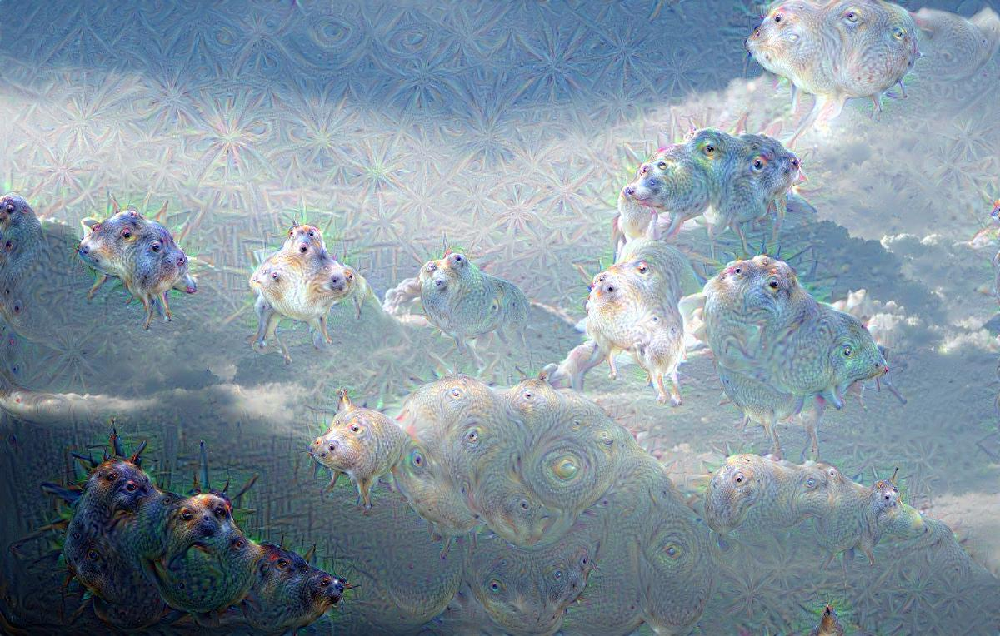

3 9 inception_4b/5x5_reduce (764, 1200, 3)


In [12]:
deepdream_cached(net, img, 'dreams/frame4b.jpg', 'inception_4b/5x5_reduce')

### Multiple iterations
It is also possible to feed the image produced by deepdream to another iteration of the function, just by adding a little zoom to it. It turns out that this leads to an endless stream of impressions of the things that the network saw during training. Some patterns fire more often than others, suggestive of basins of attraction.

In [18]:
def deepdream_cached_iterative(net, img, iterations=7, end='inception_4c/output', name=""):
    frame = img
    frame_i = 0
    h, w = frame.shape[:2]
    s = 0.05 # scale coefficient
    final_path = "dreams/"+name+"%04d.jpg"%(iterations-1)
    # check cache
    if os.path.exists(final_path):
        display(Image(final_path))
        print "Image loaded from " + final_path
    else: 
        for i in xrange(iterations):
            frame = deepdream(net, frame, endend)
            PIL.Image.fromarray(np.uint8(frame)).save("temp/%04d.jpg"%frame_i)
            if (frame_i==iterations-1):
                PIL.Image.fromarray(np.uint8(frame)).save(final_path)
            frame = nd.affine_transform(frame, [1-s,1-s,1], [h*s/2,w*s/2,0], order=1)
            frame_i += 1

In [19]:
deepdream_cached_iterative(net, img, iterations=7)

TypeError: an integer is required

This can go over infinite iterations, producing images that are completely different from the original one, like the ones showed in the introduction.

## Controlling dreams
The image detail generation method described above tends to produce some patterns more often the others. One easy way to improve the generated image diversity is to tweak the optimization objective. Here we show just one of many ways to do that, by using a second image as a "guide". 

Basically we pick a guide image and a layer, then we tell deepdream to alter the input image to enhance the features that produce a similar value in that layer. 

Note that the neural network we use was trained on images downscaled to 224x224 size. So high resolution images might have to be downscaled, so that the network could pick up their features. The image we use here is already small enough.

In [ ]:
guide = np.float32(PIL.Image.open('adversaryImages/golden-retriever_compressed.jpg'))
showarray(guide)

Now we pick some target layer and extract guide image features.
Then instead of maximizing the L2-norm of current image activations, we try to maximize the dot-products between activations of current image, and their best matching correspondences from the guide image.

This function will do everything. 

In [ ]:
def controlled_dream(net, img, guide, path='notAValidPath', end='inception_4c/output'):
    # check cache
    if os.path.exists(path):
        display(Image(path))
        print "Image loaded from " + path
    else: 
        h, w = guide.shape[:2]
        src, dst = net.blobs['data'], net.blobs[end]
        src.reshape(1,3,h,w)
        src.data[0] = preprocess(net, guide)
        net.forward(end=end)
        guide_features = dst.data[0].copy()
        def objective_guide(dst):
            x = dst.data[0].copy()
            y = guide_features
            ch = x.shape[0]
            x = x.reshape(ch,-1)
            y = y.reshape(ch,-1)
            A = x.T.dot(y) # compute the matrix of dot-products with guide features
            dst.diff[0].reshape(ch,-1)[:] = y[:,A.argmax(1)] # select ones that match best
        # dream with objective guide
        frame=deepdream(net, img, end=end, objective=objective_guide)
        if not (path=='notAValidPath'):
            PIL.Image.fromarray(np.uint8(frame)).save(path)

In [ ]:
controlled_dream(net, img, guide, 'dreams/controlled1.jpg', 'inception_3b/output')

As expected, deepdream enhances everything that can be remotely attributed to dog features or yellow flower fields. No dog shape is actually recognizable because 'inception_3b/output' is not a deep layer. 

In [ ]:
controlled_dream(net, img, guide, 'dreams/controlled2.jpg', 'inception_4c/output')

This time the target layer is way deeper, so the features look more like complete dogs and flowers instead og just dog parts.

The following examples shows how the the dream behaves when we provide an image containing something that is not among ImageNet classes. The weights have not been trained to recognize rubber ducks (as we said in previous notebooks), but can recognize baloons and buildings. 

In [ ]:
guide = np.float32(PIL.Image.open('imagesForClassification/duck.jpg'))
showarray(guide)

We can use the same end layer 'inception_5b/output' to see what is recognized at a high level.

In [ ]:
controlled_dream(net, img, guide, 'dreams/controlled3.jpg', 'inception_4c/output')

## Conclusion
...